# Dogs and Cats Classifier
This project use images of dogs and cats from [TensorFlow Datasets](https://www.tensorflow.org/datasets/catalog/overview?hl=es-419#all_datasets) to create a neural network that can classify the pictures in 2 classes, `Dog` or `Cat`.

In [1]:
import tensorflow as tf
import tensorflow_datasets as tfds
import numpy as np
import matplotlib.pyplot as plt

In [2]:
raw_data, metadata = tfds.load("cats_vs_dogs", with_info=True, as_supervised=True)

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

0 examples [00:00, ? examples/s]

Shuffling and writing examples to /root/tensorflow_datasets/cats_vs_dogs/4.0.0.incomplete0NBZ0D/cats_vs_dogs-train.tfrecord


  0%|          | 0/23262 [00:00<?, ? examples/s]

Dataset cats_vs_dogs downloaded and prepared to /root/tensorflow_datasets/cats_vs_dogs/4.0.0. Subsequent calls will reuse this data.


In [3]:
print(metadata)

tfds.core.DatasetInfo(
    name='cats_vs_dogs',
    version=4.0.0,
    description='A large set of images of cats and dogs.There are 1738 corrupted images that are dropped.',
    homepage='https://www.microsoft.com/en-us/download/details.aspx?id=54765',
    features=FeaturesDict({
        'image': Image(shape=(None, None, 3), dtype=tf.uint8),
        'image/filename': Text(shape=(), dtype=tf.string),
        'label': ClassLabel(shape=(), dtype=tf.int64, num_classes=2),
    }),
    total_num_examples=23262,
    splits={
        'train': 23262,
    },
    supervised_keys=('image', 'label'),
    citation="""@Inproceedings (Conference){asirra-a-captcha-that-exploits-interest-aligned-manual-image-categorization,
    author = {Elson, Jeremy and Douceur, John (JD) and Howell, Jon and Saul, Jared},
    title = {Asirra: A CAPTCHA that Exploits Interest-Aligned Manual Image Categorization},
    booktitle = {Proceedings of 14th ACM Conference on Computer and Communications Security (CCS)},
    ye

Here we can see that the dataset contains **23262** pictures of cats and dogs.

Let's see some images and the corresponding label. Here i'm using two methods to see some images, one is using `tfds.show_examples` and the other(more flexible) is using `matplotlib`.

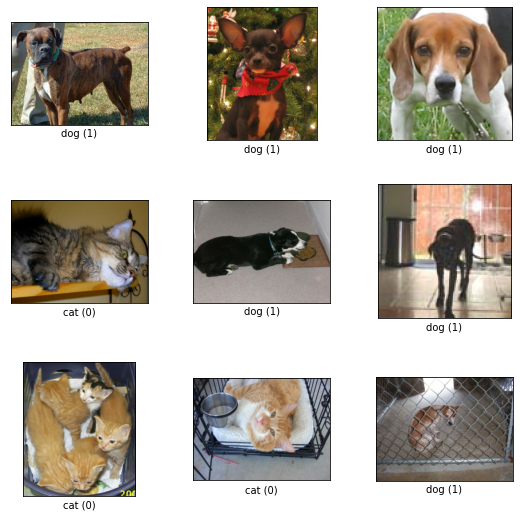

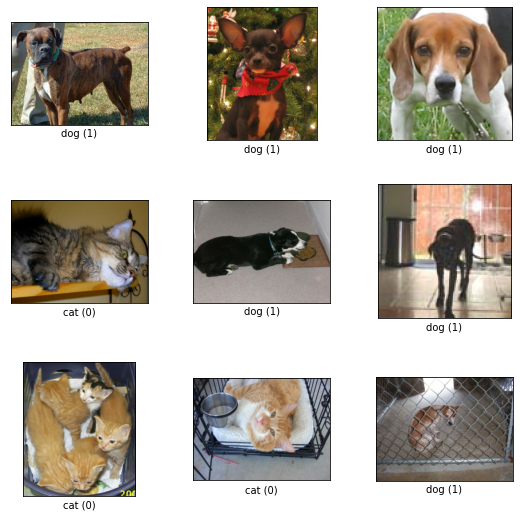

In [4]:
tfds.show_examples(raw_data['train'], metadata)

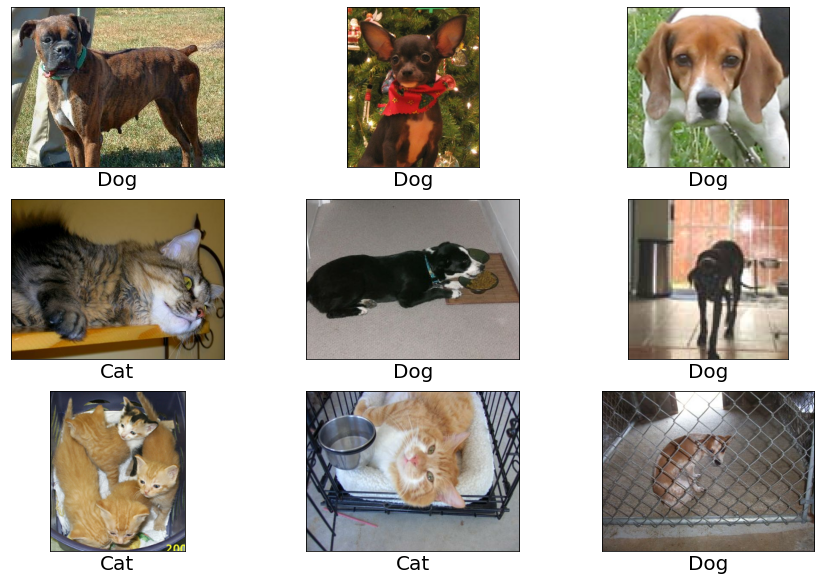

In [5]:
plt.figure(figsize=([15,10]))
for i, (image, label) in enumerate(raw_data['train'].take(9)):
  plt.subplot(3, 3, i+1)
  plt.imshow(image)
  final_label = "Dog" if np.array(label) == 1 else "Cat"
  plt.xlabel(final_label, size=20)
  plt.xticks([])
  plt.yticks([])

Next i'm going to change the size of the image because has we can see above, images have differrent sizes, the next size will be 150x150 for every image.

Second step is change the color to gray scale only because in this case the color is not very important to predict if the image contain a dog or cat.

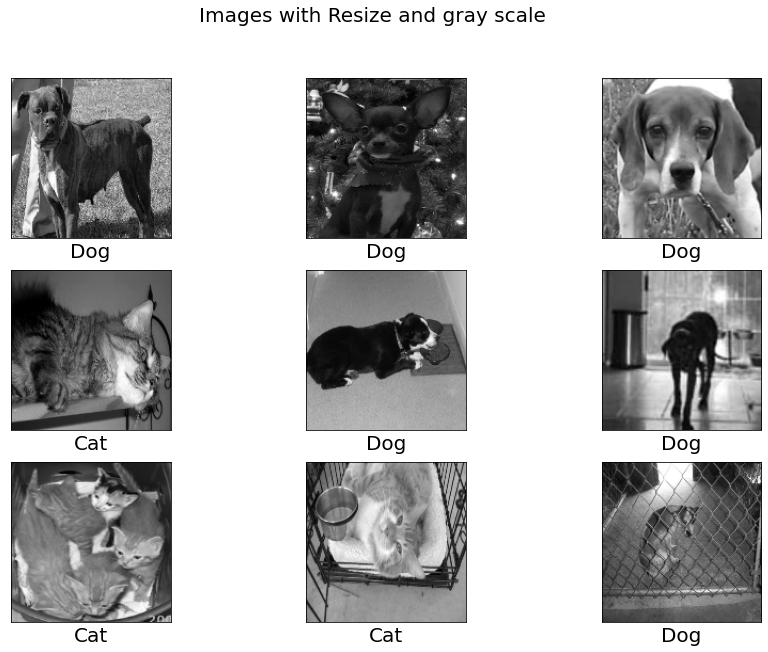

In [6]:
import cv2

IMG_SHAPE = 150

plt.figure(figsize=([15,10]))
for i, (image, label) in enumerate(raw_data['train'].take(9)):
  plt.subplot(3, 3, i+1)
  image = cv2.resize(image.numpy(), (IMG_SHAPE, IMG_SHAPE))
  image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
  plt.imshow(image, cmap="gray")
  final_label = "Dog" if np.array(label) == 1 else "Cat"
  plt.xlabel(final_label, size=20)
  plt.xticks([])
  plt.yticks([])
  plt.suptitle("Images with Resize and gray scale", size=20)

The following block of code will change all the data, and also normalize the images between 0-1.

In [7]:
X = []
y = []

for i, (image, label) in enumerate(raw_data['train']):
  image = cv2.resize(image.numpy(), (IMG_SHAPE, IMG_SHAPE))
  image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
  image = image.reshape((IMG_SHAPE, IMG_SHAPE, 1))/255
  X.append(image)
  y.append(label)

Now we can see `X` to see the normalize values of each pixel of the image.

In [8]:
X[1]

array([[[0.57647059],
        [0.69019608],
        [0.4745098 ],
        ...,
        [0.27843137],
        [0.28235294],
        [0.3372549 ]],

       [[0.59607843],
        [0.48235294],
        [0.2627451 ],
        ...,
        [0.3372549 ],
        [0.43529412],
        [0.35294118]],

       [[0.43921569],
        [0.30196078],
        [0.25882353],
        ...,
        [0.29019608],
        [0.21960784],
        [0.33333333]],

       ...,

       [[0.2627451 ],
        [0.20784314],
        [0.23529412],
        ...,
        [0.21568627],
        [0.22352941],
        [0.21176471]],

       [[0.26666667],
        [0.28235294],
        [0.2627451 ],
        ...,
        [0.19215686],
        [0.24313725],
        [0.24705882]],

       [[0.2627451 ],
        [0.25882353],
        [0.41960784],
        ...,
        [0.24313725],
        [0.23529412],
        [0.26666667]]])

If we try to see the labels of the images located inside `y`, we are going to see **Tensor's**, to convert this tensor to a normal array with the labels it is required to use ***numpy.array()***. 

In [9]:
print("---- before using numpy ----")
print(y[1])
print("\n---- after using numpy ----")
y = np.array(y)
print(y[1])

---- before using numpy ----
tf.Tensor(1, shape=(), dtype=int64)

---- after using numpy ----
1


In [10]:
X = np.array(X)
X.shape

(23262, 150, 150, 1)

At this point we have already completed most of the basic pre-processing, next we are going to perform ***data augmentation***, this will help the model learn more image combinations since we are going to generate images with some variations such as zooming, rotating, etc.

These are the images before data augmentation:

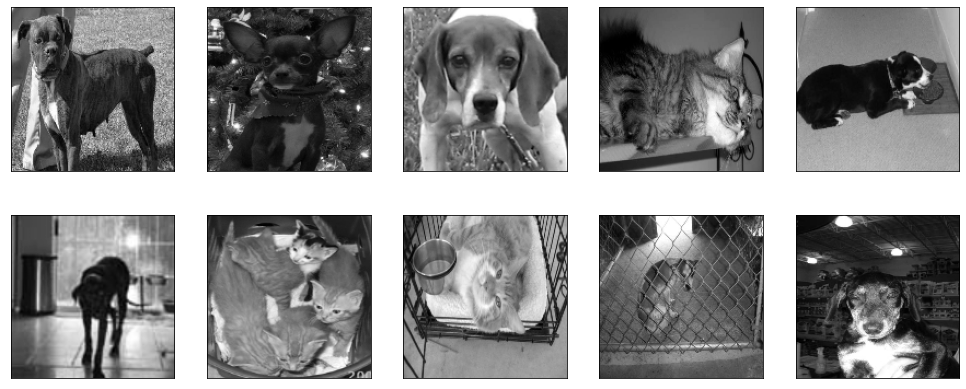

In [11]:

plt.figure(figsize=([17,7]))
for i in range(10):
  plt.subplot(2,5, i+1)
  plt.imshow(X[i].reshape(150,150), cmap='gray')
  plt.xticks([])
  plt.yticks([])

To perfomed data augmentation i'm going to use **ImageDataGenerator**. 

See the documentation in [TensorFlow](https://www.tensorflow.org/api_docs/python/tf/keras/preprocessing/image/ImageDataGenerator) to see all the parameters for this function.


In [12]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

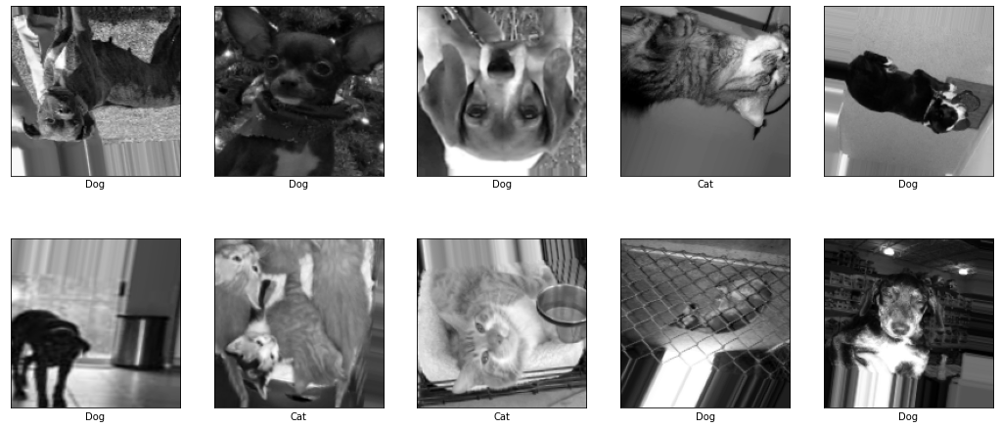

In [13]:
img_generator = ImageDataGenerator(
    rotation_range=20,
    zoom_range=[.7, 1.3],
    width_shift_range=0.2,
    height_shift_range=0.2,
    horizontal_flip=True,
    vertical_flip=True,
)

img_generator.fit(X)

plt.figure(figsize=([18,8]))
for image, label in img_generator.flow(X, y, batch_size=10, shuffle=False):
  for i in range(10):
    plt.subplot(2,5, i+1)
    plt.imshow(image[i].reshape(150,150), cmap='gray')
    plt.xlabel("Dog" if np.array(label[i]) == 1 else "Cat")
    plt.xticks([])
    plt.yticks([])
  break

Now it is time to make the split of the data, 80% to training and 20% to validation.

In [14]:
X_train = X[:round(len(X)*.80)]
X_test = X[round(len(X)*.80):]

y_train = y[:round(len(X)*.80)]
y_test = y[round(len(X)*.80):]

print("---- Train/Validation Size ----")
print("X_train:", len(X_train))
print("X_test:", len(X_test))
print("y_train:", len(y_train))
print("y_test:", len(y_test))

---- Train/Validation Size ----
X_train: 18610
X_test: 4652
y_train: 18610
y_test: 4652


In [15]:
full_train = img_generator.flow(X_train, y_train, batch_size=32)

**CNN creation:**

In [16]:
model = tf.keras.Sequential([
        tf.keras.layers.Conv2D(32, (3,3), activation="relu", input_shape=(IMG_SHAPE, IMG_SHAPE, 1)),
        tf.keras.layers.MaxPool2D((2,2)),

        tf.keras.layers.Conv2D(64, (3,3), activation="relu"),
        tf.keras.layers.MaxPool2D((2,2)),

        tf.keras.layers.Conv2D(128, (3,3), activation="relu"),
        tf.keras.layers.MaxPool2D((2,2)),

        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(100, activation="relu"),
        tf.keras.layers.Dense(1, activation="sigmoid")
])

In [17]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 148, 148, 32)      320       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 74, 74, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 72, 72, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 36, 36, 64)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 34, 34, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 17, 17, 128)      0

In [18]:
model.compile(optimizer="adam",
              loss="binary_crossentropy",
              metrics=['accuracy'])

Before start training the model, im going to use **TensorBoard** to see the performance of the model during training. This is just one way to see the performance, but of course im going to make the plots manually also using matplotlib.

In [19]:
from tensorflow.keras.callbacks import TensorBoard

In [20]:
!mkdir logs

In [21]:
tensorboard = TensorBoard(log_dir='logs/CNN')

In [22]:
history = model.fit(full_train,
                    batch_size=32,
                    epochs=100,
                    validation_data=(X_test, y_test),
                    steps_per_epoch=int(np.ceil(len(X_train) / float(32))),
                    validation_steps=int(np.ceil(len(X_test) / float(32))),
                    callbacks=[tensorboard]
                    )

Epoch 1/100
582/582 [==============================] - 51s 68ms/step - loss: 0.6875 - accuracy: 0.5469 - val_loss: 0.6805 - val_accuracy: 0.6015
Epoch 2/100
582/582 [==============================] - 38s 66ms/step - loss: 0.6599 - accuracy: 0.6106 - val_loss: 0.6247 - val_accuracy: 0.6653
Epoch 3/100
582/582 [==============================] - 39s 66ms/step - loss: 0.6367 - accuracy: 0.6404 - val_loss: 0.6086 - val_accuracy: 0.6627
Epoch 4/100
582/582 [==============================] - 37s 64ms/step - loss: 0.6198 - accuracy: 0.6617 - val_loss: 0.5701 - val_accuracy: 0.7077
Epoch 5/100
582/582 [==============================] - 37s 64ms/step - loss: 0.6028 - accuracy: 0.6731 - val_loss: 0.5878 - val_accuracy: 0.6890
Epoch 6/100
582/582 [==============================] - 37s 64ms/step - loss: 0.5864 - accuracy: 0.6913 - val_loss: 0.5369 - val_accuracy: 0.7309
Epoch 7/100
582/582 [==============================] - 37s 64ms/step - loss: 0.5694 - accuracy: 0.7027 - val_loss: 0.5575 - val_ac

In [23]:
%load_ext tensorboard

In [24]:
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

Text(0.5, 1.0, 'Loss')

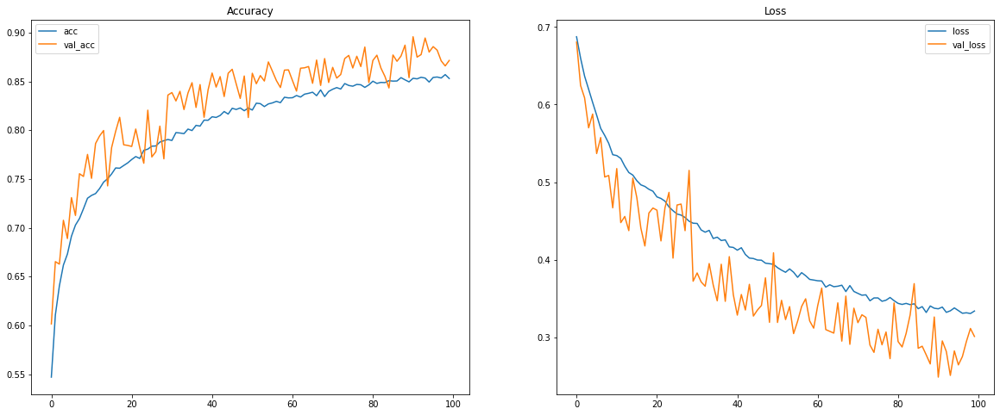

In [25]:
plt.figure(figsize=([20,8]))

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(100)

plt.subplot(1,2, 1)
plt.plot(epochs_range, acc, label='acc')
plt.plot(epochs_range, val_acc, label='val_acc')
plt.legend(loc='best')
plt.title("Accuracy")

plt.subplot(1,2, 2)
plt.plot(epochs_range, loss, label='loss')
plt.plot(epochs_range, val_loss, label='val_loss')
plt.legend(loc='best')
plt.title("Loss")

In [26]:
model.save('cat_vs_dogs_model.h5')

In [27]:
!pip install tensorflowjs

     |████████████████████████████████| 77 kB 6.6 MB/s 


In [28]:
!mkdir final_model

In [29]:
!tensorflowjs_converter --input_format keras cat_vs_dogs_model.h5 final_model

In [31]:
import gc
gc.collect()

131